In [22]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

In [38]:
# File path
file_path1 = '/Volumes/T7/Solar_uptake_data/sgu-solar-capacity-2001-to-2010.csv'

file_path2 = '/Volumes/T7/Solar_uptake_data/sgu-solar-capacity-2011-to-present.csv'

df1 = pd.read_csv(file_path1)  # 2001-2010 data
df2 = pd.read_csv(file_path2)  # 2011-present data

# Merge the dataframes based on postcode
# Using outer join to keep all postcodes from both datasets
solar_data = pd.merge(df1, df2, 
                    left_on='Small Unit Installation Postcode',
                    right_on='Small Unit Postcode',
                    how='outer')

In [39]:
solar_data.head()

,Small Unit Installation Postcode,Apr 2001 - SGU Rated Output In kW,May 2001 - SGU Rated Output In kW,Jun 2001 - SGU Rated Output In kW,Jul 2001 - SGU Rated Output In kW,Aug 2001 - SGU Rated Output In kW,Sep 2001 - SGU Rated Output In kW,Oct 2001 - SGU Rated Output In kW,Nov 2001 - SGU Rated Output In kW,Dec 2001 - SGU Rated Output In kW,...,Jan 2024 - SGU Rated Output In kW,Feb 2024 - SGU Rated Output In kW,Mar 2024 - SGU Rated Output In kW,Apr 2024 - SGU Rated Output In kW,May 2024 - SGU Rated Output In kW,Jun 2024 - SGU Rated Output In kW,Jul 2024 - SGU Rated Output In kW,Aug 2024 - SGU Rated Output In kW,Sep 2024 - SGU Rated Output in kW,Oct 2024 - SGU Rated Output in kW
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.0
1,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.0
2,800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,199.59,0.0,0.0,94.38,0.0,29.92,0.0,0.0
3,801.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.0
4,803.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0.00,0.0,0.0


In [41]:
# Calculate cumulative sum across columns (excluding postcode column)
# First get all columns except postcode
capacity_columns = [col for col in solar_data.columns if 'kW' in col]

# Create new DataFrame with cumulative sums
cumulative_df = solar_data.copy()
cumulative_df[capacity_columns] = solar_data[capacity_columns].cumsum(axis=1)

# Save the cumulative data if needed
cumulative_df.to_csv('cumulative_solar_capacity.csv', index=False)

# To verify it worked:
print("First few rows of cumulative capacity:")
cumulative_df.head()

First few rows of cumulative capacity:


,Small Unit Installation Postcode,Apr 2001 - SGU Rated Output In kW,May 2001 - SGU Rated Output In kW,Jun 2001 - SGU Rated Output In kW,Jul 2001 - SGU Rated Output In kW,Aug 2001 - SGU Rated Output In kW,Sep 2001 - SGU Rated Output In kW,Oct 2001 - SGU Rated Output In kW,Nov 2001 - SGU Rated Output In kW,Dec 2001 - SGU Rated Output In kW,...,Jan 2024 - SGU Rated Output In kW,Feb 2024 - SGU Rated Output In kW,Mar 2024 - SGU Rated Output In kW,Apr 2024 - SGU Rated Output In kW,May 2024 - SGU Rated Output In kW,Jun 2024 - SGU Rated Output In kW,Jul 2024 - SGU Rated Output In kW,Aug 2024 - SGU Rated Output In kW,Sep 2024 - SGU Rated Output in kW,Oct 2024 - SGU Rated Output in kW
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,4.460,4.460,4.460,4.460,4.460,4.460,4.460,4.460,4.460,4.460
1,200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.080,0.080,0.080,0.080,0.080,0.080,0.080,0.080,0.080,0.080
2,800.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,3759.580,3759.580,3959.170,3959.170,3959.170,4053.550,4053.550,4083.470,4083.470,4083.470
3,801.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,386.598,386.598,386.598,386.598,386.598,386.598,386.598,386.598,386.598,386.598
4,803.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,11.685,11.685,11.685,11.685,11.685,11.685,11.685,11.685,11.685,11.685


In [43]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming we already have cumulative_df from previous code
# First, let's get our x-axis (dates) and make them datetime
capacity_columns = [col for col in cumulative_df.columns if 'kW' in col]
dates = pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])

# Create a figure with appropriate size
plt.figure(figsize=(15, 10))

# Plot each postcode's cumulative capacity
for index, row in cumulative_df.iterrows():
    postcode = row['Small Unit Installation Postcode']
    values = row[capacity_columns]
    plt.plot(dates, values, label=f'Postcode {postcode}')

# Customize the plot
plt.title('Cumulative Solar Capacity by Postcode Over Time')
plt.xlabel('Date')
plt.ylabel('Cumulative Capacity (kW)')
plt.grid(True)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add legend (might be crowded with many postcodes)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()

/var/folders/xw/3fpv2dn948lcf41k_wd6vbxh0000gn/T/ipykernel_29503/2954594106.py:7: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dates = pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])
/var/folders/xw/3fpv2dn948lcf41k_wd6vbxh0000gn/T/ipykernel_29503/2954594106.py:31: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


/var/folders/xw/3fpv2dn948lcf41k_wd6vbxh0000gn/T/ipykernel_29503/2187629795.py:11: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  'Date': pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])


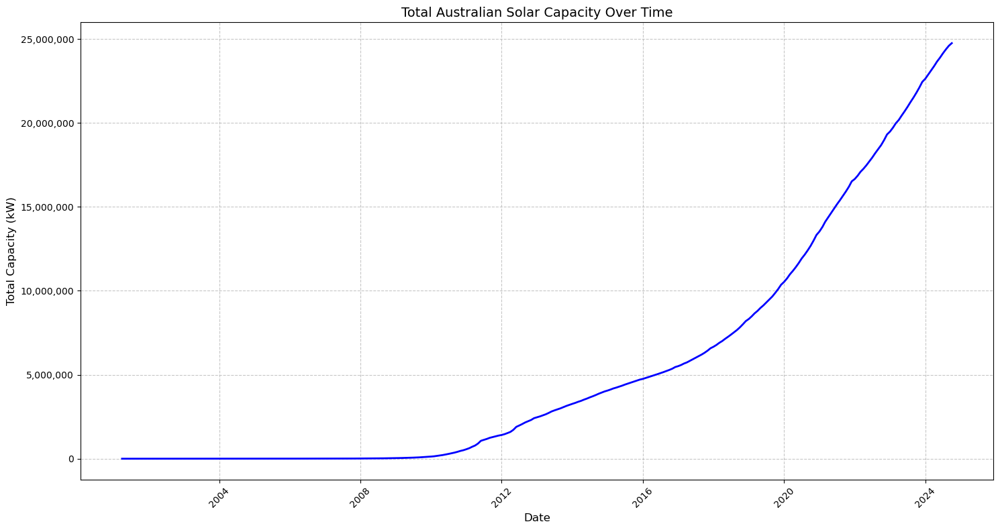

Current total Australian capacity: 24,751,031.38 kW


In [44]:
import pandas as pd
import matplotlib.pyplot as plt

# Create a new DataFrame with just the total Australian capacity
# Sum all postcodes for each month
total_capacity = cumulative_df[capacity_columns].sum()

# Convert the series to a DataFrame with dates as index
aus_total_df = pd.DataFrame({
    'Total_Capacity': total_capacity,
    'Date': pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])
}).set_index('Date')

# Create the line plot
plt.figure(figsize=(15, 8))
plt.plot(aus_total_df.index, aus_total_df['Total_Capacity'], 
         linewidth=2, color='blue')

# Customize the plot
plt.title('Total Australian Solar Capacity Over Time', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Total Capacity (kW)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Rotate x-axis labels
plt.xticks(rotation=45)

# Add commas to y-axis for better readability
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Print total current capacity
print(f"Current total Australian capacity: {aus_total_df['Total_Capacity'].iloc[-1]:,.2f} kW")

In [24]:
# Load the postcode shapefile
# Path to the .shp file
shapefile_path = '/Volumes/T7/POA_2021_AUST_GDA2020_SHP'

postcode_shapes = gpd.read_file(shapefile_path)

print(postcode_shapes.columns)

Index(['POA_CODE21', 'POA_NAME21', 'AUS_CODE21', 'AUS_NAME21', 'AREASQKM21',
       'LOCI_URI21', 'SHAPE_Leng', 'SHAPE_Area', 'geometry'],
      dtype='object')


In [27]:
# Ensure both columns are strings
postcode_shapes['POA_CODE21'] = postcode_shapes['POA_CODE21'].astype(str)
solar_data['Small Unit Postcode'] = solar_data['Small Unit Postcode'].astype(str)

# Merge the data
merged_data = postcode_shapes.merge(solar_data, left_on='POA_CODE21', right_on='Small Unit Postcode')

print(merged_data.columns)

Index(['POA_CODE21', 'POA_NAME21', 'AUS_CODE21', 'AUS_NAME21', 'AREASQKM21',
       'LOCI_URI21', 'SHAPE_Leng', 'SHAPE_Area', 'geometry',
       'Small Unit Postcode',
       ...
       'Jan 2024 - SGU Rated Output In kW',
       'Feb 2024 - SGU Rated Output In kW',
       'Mar 2024 - SGU Rated Output In kW',
       'Apr 2024 - SGU Rated Output In kW',
       'May 2024 - SGU Rated Output In kW',
       'Jun 2024 - SGU Rated Output In kW',
       'Jul 2024 - SGU Rated Output In kW',
       'Aug 2024 - SGU Rated Output In kW',
       'Sep 2024 - SGU Rated Output in kW',
       'Oct 2024 - SGU Rated Output in kW'],
      dtype='object', length=176)


In [31]:
# Filter columns that contain 'Jan' in their name
january_columns = [col for col in merged_data.columns if 'Jan' in col]

# Compute global min and max across all January columns
vmin = merged_data[january_columns].min().min()
vmax = merged_data[january_columns].max().max()

print(f"Global min: {vmin}, Global max: {vmax}")

Global min: 0.0, Global max: 1839.165


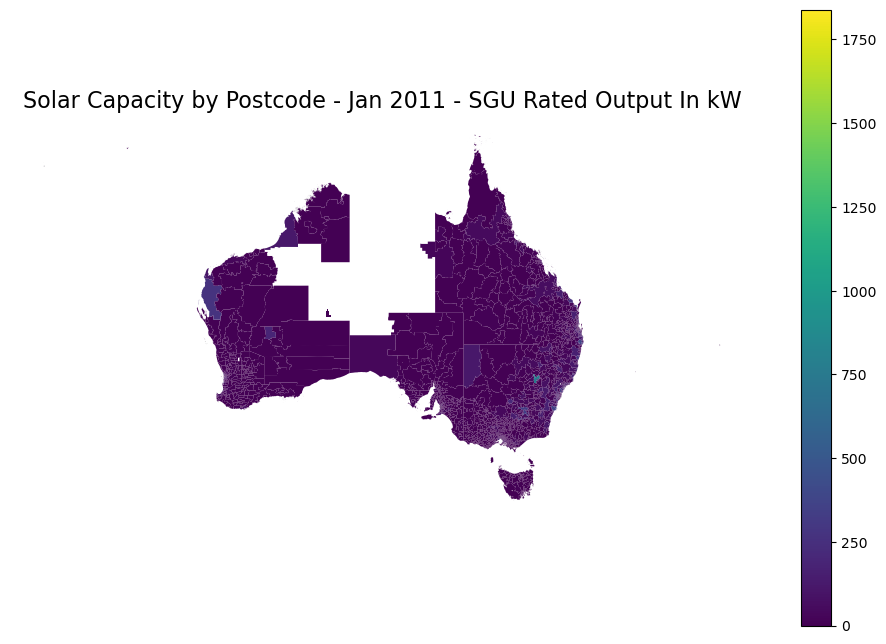

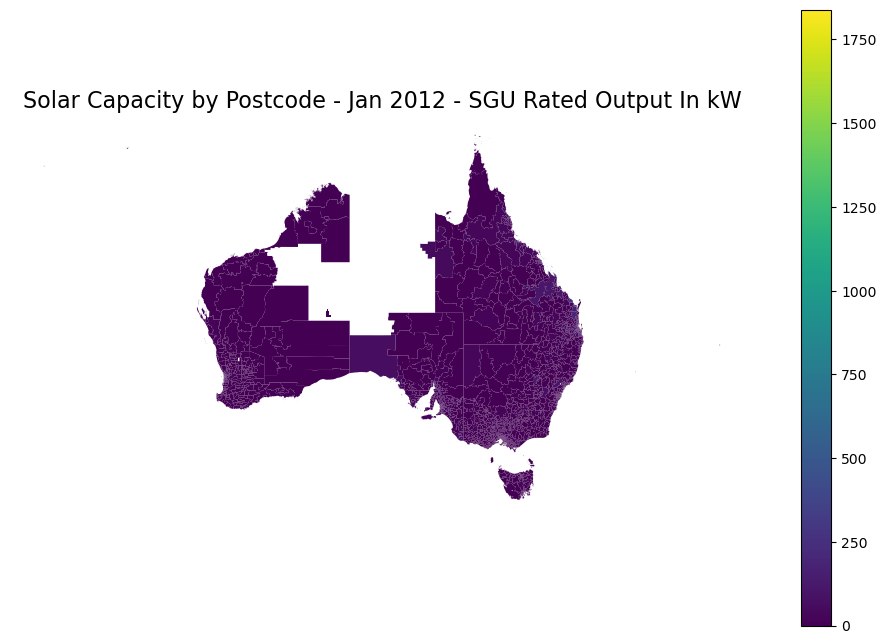

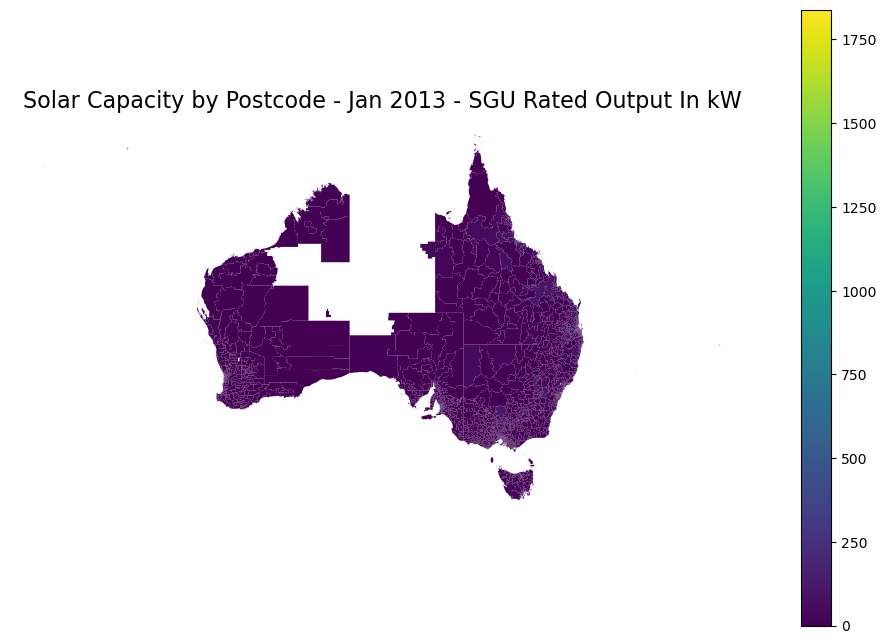

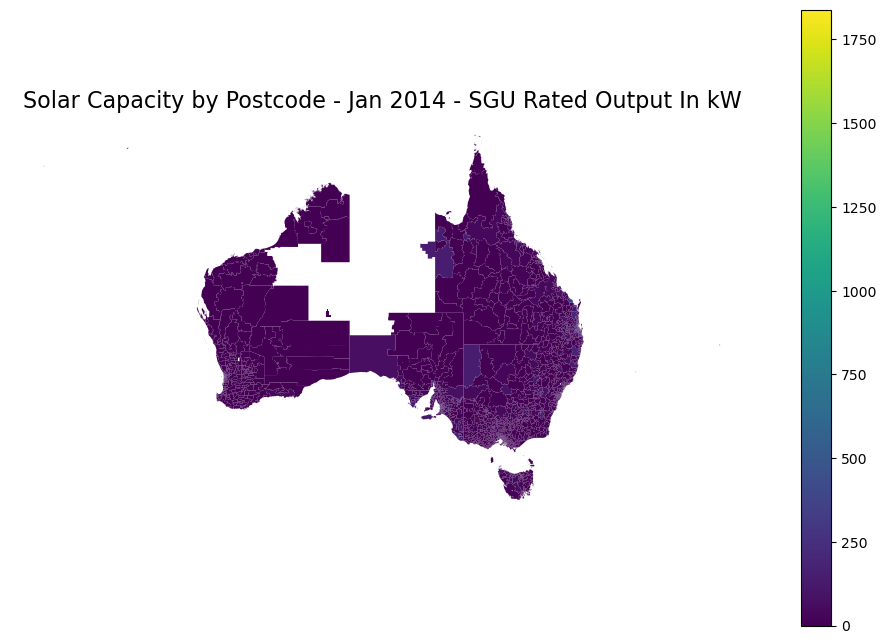

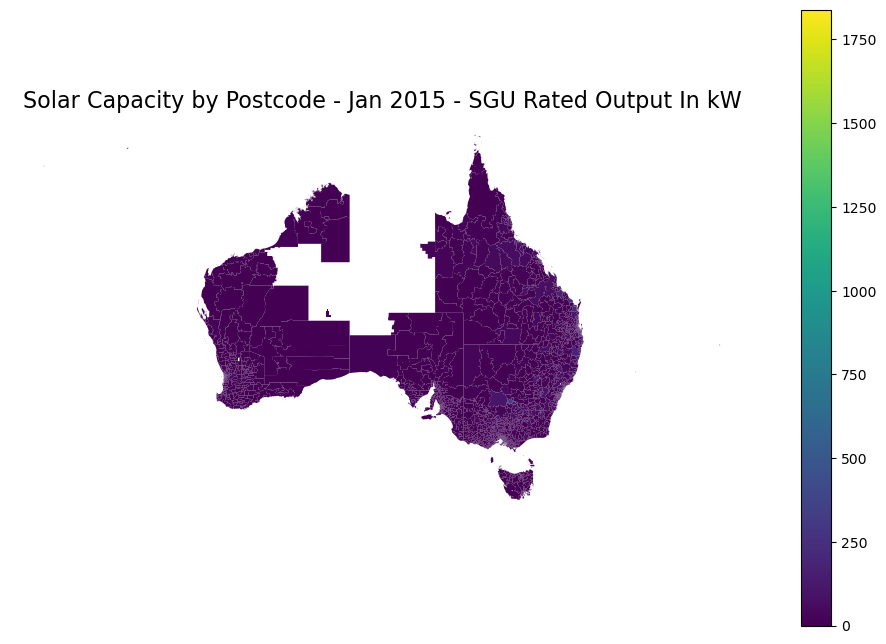

...

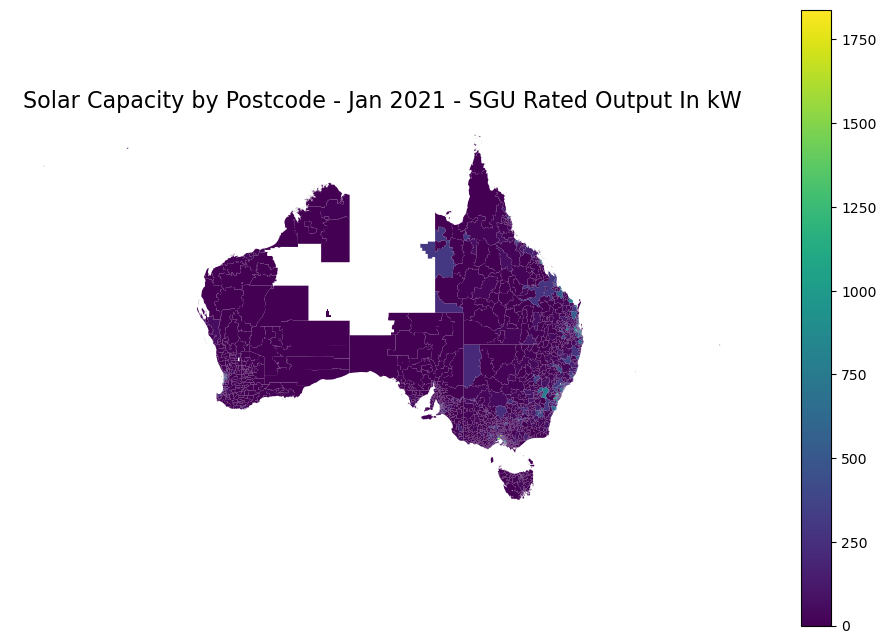

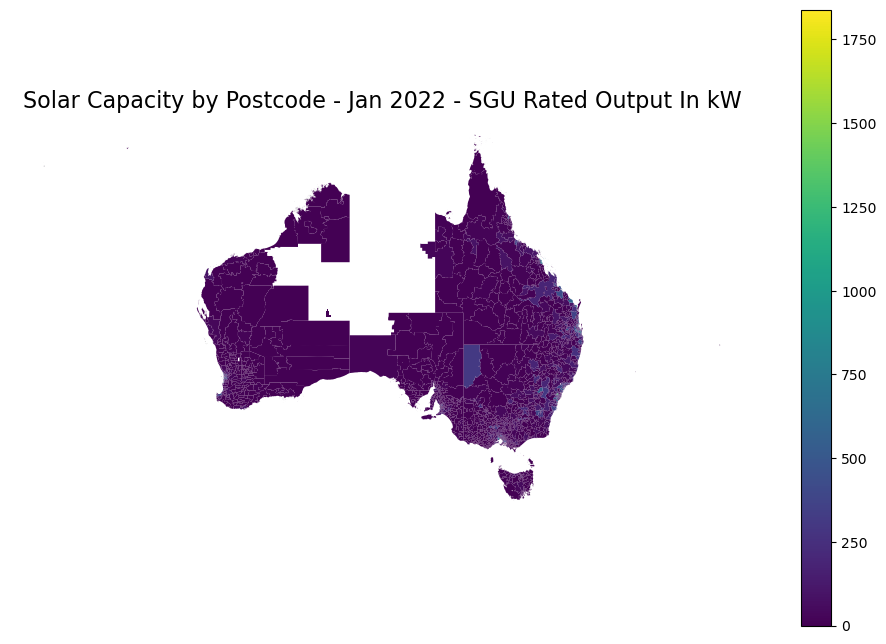

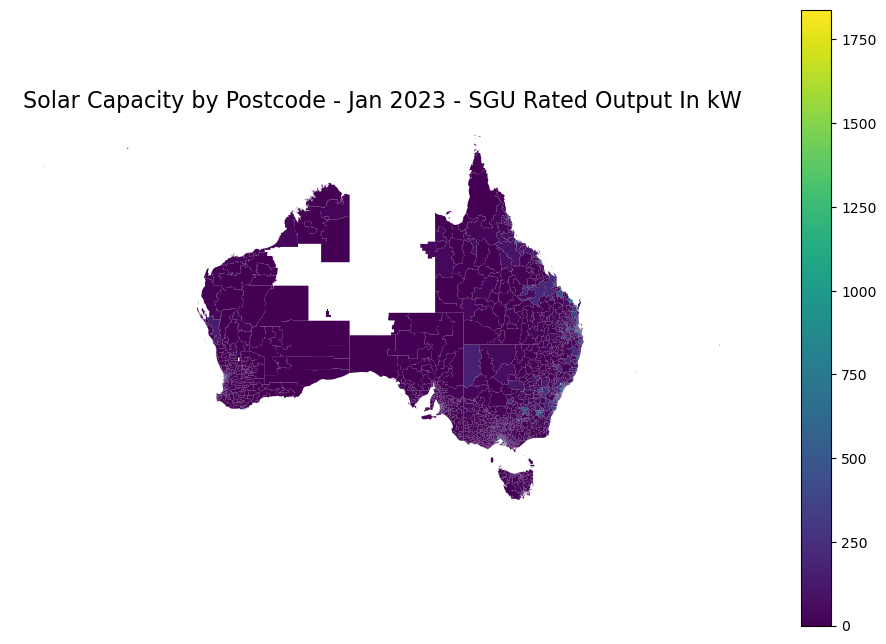

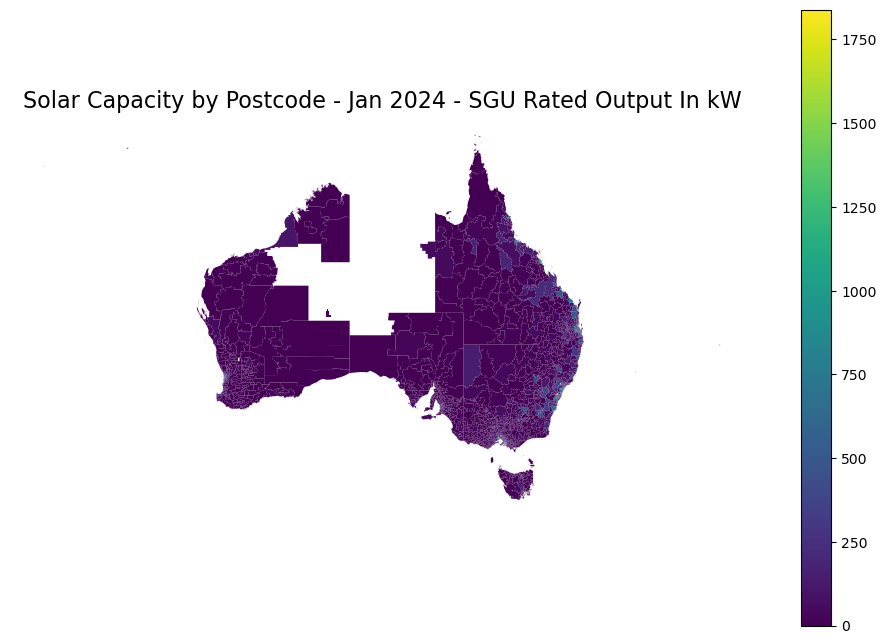

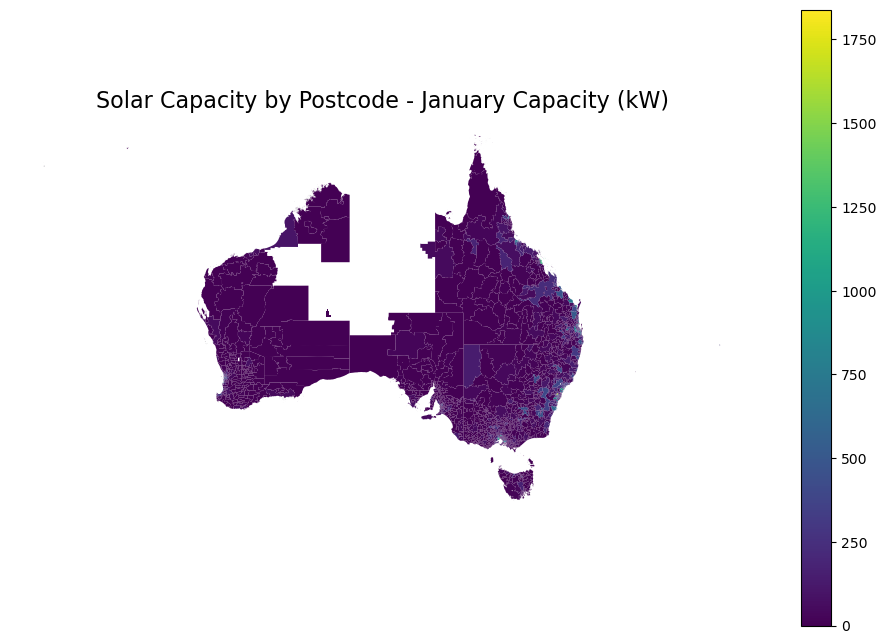

In [32]:
import matplotlib.pyplot as plt

# Iterate through each January column
for col in january_columns:
    # Add the column as a new field for easier plotting
    merged_data['January Capacity (kW)'] = merged_data[col]

    # Plot the data
    ax = merged_data.plot(
        column='January Capacity (kW)',
        cmap='viridis',    # Use your preferred color map
        legend=True,
        figsize=(12, 8),
        vmin=vmin,         # Set global minimum
        vmax=vmax          # Set global maximum
    )

    # Customize the plot title
    plt.title(f"Solar Capacity by Postcode - {col}", fontsize=16)
    plt.axis('off')  # Remove axes for a clean map look

    # Show the plot for each year
    plt.show()

In [33]:
# Identify all monthly capacity columns
capacity_columns = [col for col in merged_data.columns if 'Rated Output' in col]
print(capacity_columns)  # Confirm the columns

['Jan 2011 - SGU Rated Output In kW', 'Feb 2011 - SGU Rated Output In kW', 'Mar 2011 - SGU Rated Output In kW', 'Apr 2011 - SGU Rated Output In kW', 'May 2011 - SGU Rated Output In kW', 'Jun 2011 - SGU Rated Output In kW', 'Jul 2011 - SGU Rated Output In kW', 'Aug 2011 - SGU Rated Output In kW', 'Sep 2011 - SGU Rated Output In kW', 'Oct 2011 - SGU Rated Output In kW', 'Nov 2011 - SGU Rated Output In kW', 'Dec 2011 - SGU Rated Output In kW', 'Jan 2012 - SGU Rated Output In kW', 'Feb 2012 - SGU Rated Output In kW', 'Mar 2012 - SGU Rated Output In kW', 'Apr 2012 - SGU Rated Output In kW', 'May 2012 - SGU Rated Output In kW', 'Jun 2012 - SGU Rated Output In kW', 'Jul 2012 - SGU Rated Output In kW', 'Aug 2012 - SGU Rated Output In kW', 'Sep 2012 - SGU Rated Output In kW', 'Oct 2012 - SGU Rated Output In kW', 'Nov 2012 - SGU Rated Output In kW', 'Dec 2012 - SGU Rated Output In kW', 'Jan 2013 - SGU Rated Output In kW', 'Feb 2013 - SGU Rated Output In kW', 'Mar 2013 - SGU Rated Output In kW', 

In [34]:
# Calculate the running total across capacity columns
merged_data['Cumulative Capacity'] = merged_data[capacity_columns].cumsum(axis=1)

# Filter January columns from the cumulative data
january_columns = [col for col in merged_data.columns if 'Jan' in col]

# Create a GeoDataFrame for each January column
cumulative_january = merged_data[['geometry'] + january_columns]

ValueError: Cannot set a DataFrame with multiple columns to the single column Cumulative Capacity